## PURPOSE OF THE NOTEBOOK
The aim of this notebook is to define vessels present in the GB sections and define size, structure and composition of them

# Import all libraries & functions needed

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import scipy.stats as st
import warnings
warnings.filterwarnings('ignore')
import squidpy as sq
import scanpy as sc
import os 
import seaborn as sns
import networkx as nx
from scipy.spatial import ConvexHull, convex_hull_plot_2d
import numpy as np
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
from tqdm import tqdm
import scipy.stats as scpst

In [3]:
def connected_components(neighbors):
    seen = set()
    def component(node):
        nodes = set([node])
        while nodes:
            node = nodes.pop()
            seen.add(node)
            nodes |= neighbors[node] - seen
            yield node
    for node in neighbors:
        if node not in seen:
            yield component(node)
def getRoots(aNeigh):
    def findRoot(aNode,aRoot):
        while aNode != aRoot[aNode][0]:
            aNode = aRoot[aNode][0]
        return (aNode,aRoot[aNode][1])
    myRoot = {} 
    for myNode in aNeigh.keys():
        myRoot[myNode] = (myNode,0)  
    for myI in aNeigh: 
        for myJ in aNeigh[myI]: 
            try:
                (myRoot_myI,myDepthMyI) = findRoot(myI,myRoot) 
                (myRoot_myJ,myDepthMyJ) = findRoot(myJ,myRoot) 
                if myRoot_myI != myRoot_myJ: 
                    myMin = myRoot_myI
                    myMax = myRoot_myJ 
                    if  myDepthMyI > myDepthMyJ: 
                        myMin = myRoot_myJ
                        myMax = myRoot_myI
                    myRoot[myMax] = (myMax,max(myRoot[myMin][1]+1,myRoot[myMax][1]))
                    myRoot[myMin] = (myRoot[myMax][0],-1) 
            except:
                sss=2
    myToRet = {}
    for myI in aNeigh: 
        if myRoot[myI][0] == myI:
            myToRet[myI] = []
    for myI in aNeigh: 
        myToRet[findRoot(myI,myRoot)[0]].append(myI) 
    return myToRet  

# first we load the dataset

In [4]:
general_path='/media/sergio/GBX/GBmap samples/'
global_path=general_path+'ISS_samples/'
adata=sc.read(general_path+'/ISS_global_analysis/all_samples_with_probabilities.h5ad') # should be with colors

# vessel analysis

We aim to define individual vessels detected. We will define a vessel as a group of enrotheial/mural cells detected in close proximity
For spatial neighborhood, we aim for close proximity, since we are defining vessels
Therefore, if considering a radius of 20um, this will be 61.5 in pixel scale.  

In [10]:
anndata_list = []
for sample in adata.obs['sample'].unique():
    adata_copy_int = adata[adata.obs['sample']==sample]
    sq.gr.spatial_neighbors(adata_copy_int,n_neighs=5)
    anndata_list.append(adata_copy_int)
adata = sc.concat(anndata_list, pairwise=True)

NOT all mural cells and endothelial cells are in vessels. This we could observe from the nhood analysis. Therefore, we just include in the ad_vessel those that are clearly part of the vessels

In [12]:
ad_vessel=adata[adata.obs['level4'].isin(['Endo arterial','Pericyte','Tip-like','SMC','SMC prolif','Endo capilar','Scavenging endothelial','Scavenging pericyte'])]

In [13]:
sname='ClassName'
tr=ad_vessel.obsp['spatial_distances'].transpose()
connections=tr
ID_to_cell=dict(zip(ad_vessel.obs.index,range(0,ad_vessel.obs.shape[0])))
input_data =connections
ind=input_data.transpose()
sel=ind.max(axis=1)>0
G = nx.DiGraph(ind)

In [14]:
gri={}
for el in G.edges():
    try:
        gri[el[0]].append(el[1])
    except:
        gri[el[0]]=[el[1]]

In [19]:
rooties=getRoots(gri)
vesseldic={}
vesseldicID={}
for el in rooties:
    for els in rooties[el]:
        vesseldic[els]=len(rooties[el])
        #if len(rooties[el])>30:
        vesseldicID[els]=str(el)
solitary=[i for i in range(0,ad_vessel.obs.shape[0]) if i not in vesseldic.keys()]
for sl in solitary:
    vesseldic[sl]=1
maxid=np.max(list(vesseldicID.keys()))
add=1
for sl in solitary:
    vesseldicID[sl]=maxid+add
    add=add+1

In [59]:
ad_vessel.obs['vessel_size']=ad_vessel.obs.index.map(ID_to_cell).map(vesseldic)
ad_vessel.obs['vessel']=ad_vessel.obs.index.map(ID_to_cell).map(vesseldicID).astype(str)
ad_vessel.obs.loc[:,'vessel_size_round']=ad_vessel.obs.loc[:,'vessel_size'].round(-1)
ad_vessel.obs.loc[ad_vessel.obs.loc[:,'vessel_size_round']>50,'vessel_size_round']=50

# We explore changes in compsition by vessel size

Text(0.5, 1.0, 'Size of the vessels')

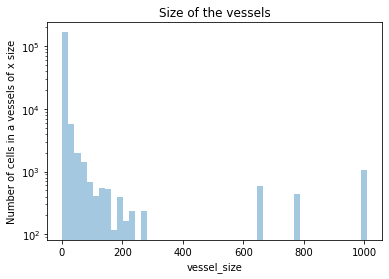

In [73]:
sns.distplot(ad_vessel.obs['vessel_size'],kde=False)
plt.yscale('log')
plt.ylabel('Number of cells in a vessels of x size')
plt.title('Size of the vessels')

#  We classify the size of vessels in groups 

In [184]:
ad_vessel.obs['vessel_groups']='individual'
ad_vessel.obs.loc[ad_vessel.obs['vessel_size']>2,'vessel_groups']='small'
ad_vessel.obs.loc[ad_vessel.obs['vessel_size']>19,'vessel_groups']='large'
ad_vessel.obs.loc[ad_vessel.obs['vessel_size']>49,'vessel_groups']='gigantic'

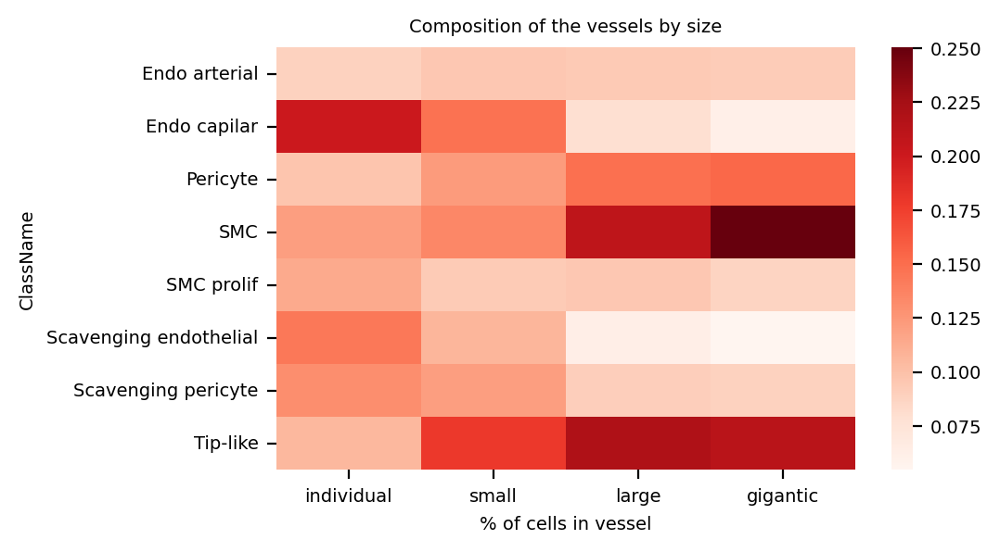

In [201]:
import matplotlib
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=(5,3), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.heatmap(vbt_norm.transpose(),cmap='Reds')
plt.xlabel('% of cells in vessel')
plt.title('Composition of the vessels by size')
plt.savefig(general_path+'/ISS_global_analysis/heatmap_composition_of_vessels_by_size.pdf')

<AxesSubplot:xlabel='vessel_groups'>

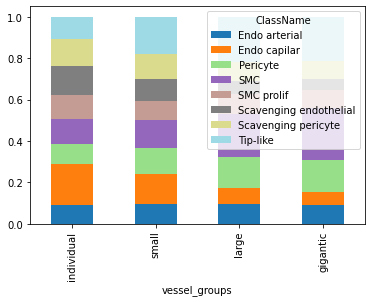

In [187]:
sname='ClassName'
vessel_by_type=pd.crosstab(ad_vessel.obs['vessel_groups'],ad_vessel.obs[sname]).transpose()
vessel_by_type=vessel_by_type.loc[:,['individual','small','large','gigantic']]
vbt_norm=vessel_by_type.div(vessel_by_type.sum(axis=0),axis=1).transpose()
vbt_norm.plot(stacked=True,kind='bar',cmap='tab20')

# Next, we explore changes in expression by vessel size

In [36]:
ad_vessel.obs['vessel_size_round']=ad_vessel.obs['vessel_size_round'].astype(str).astype('category')

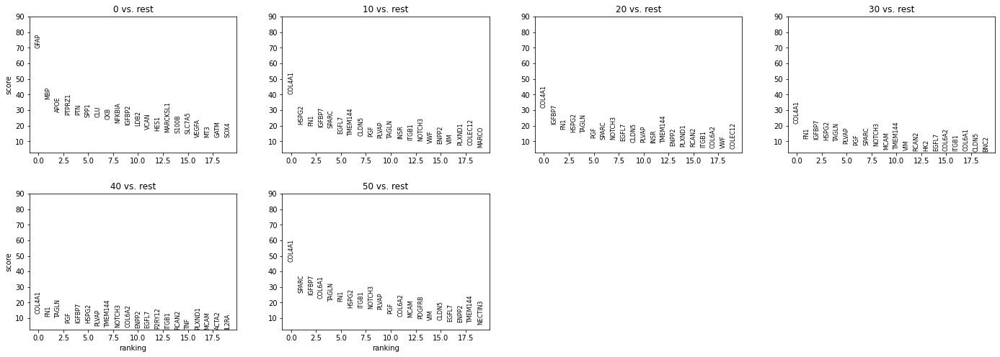

In [38]:
sc.tl.rank_genes_groups(ad_vessel,groupby='vessel_size_round')
sc.pl.rank_genes_groups(ad_vessel)

# Spatially plotting the vessels

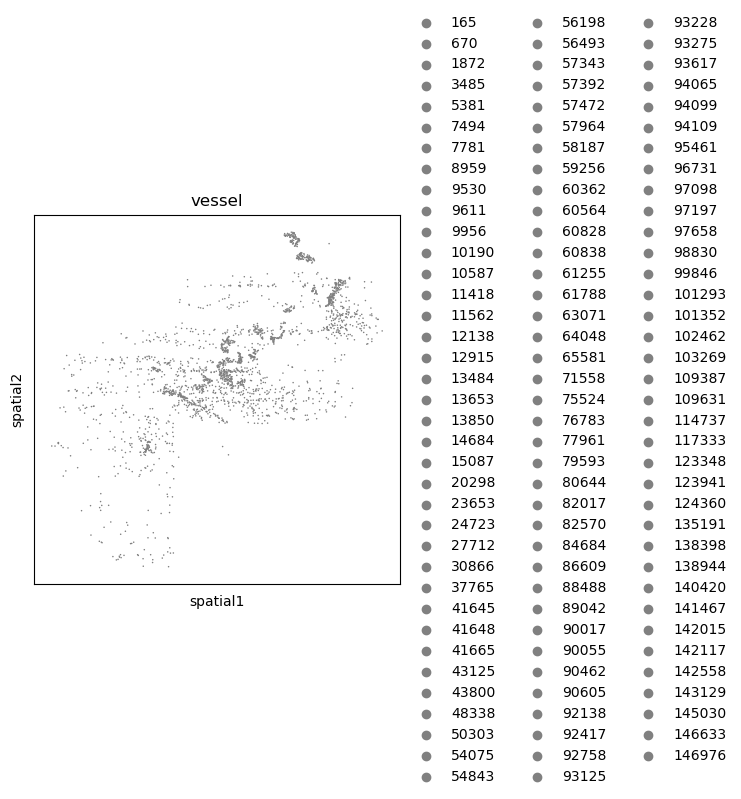

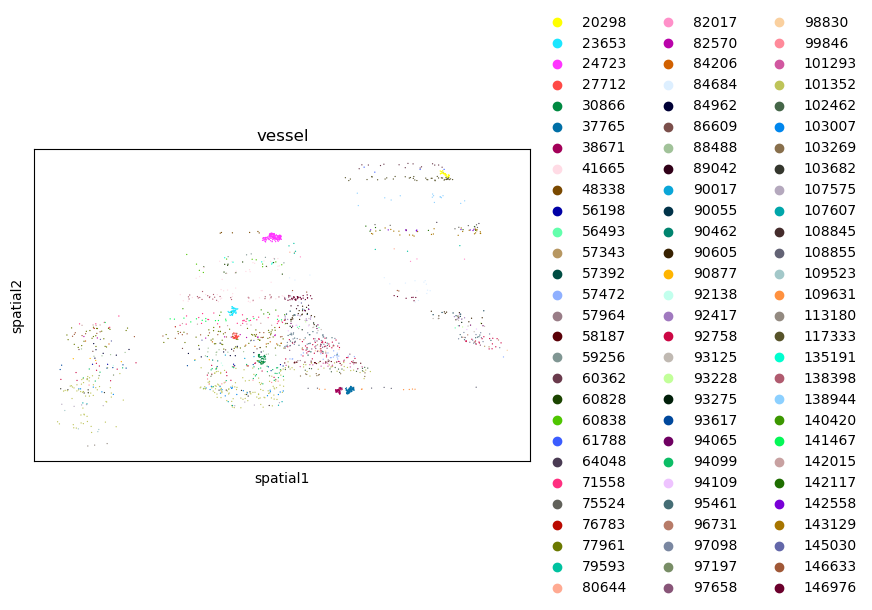

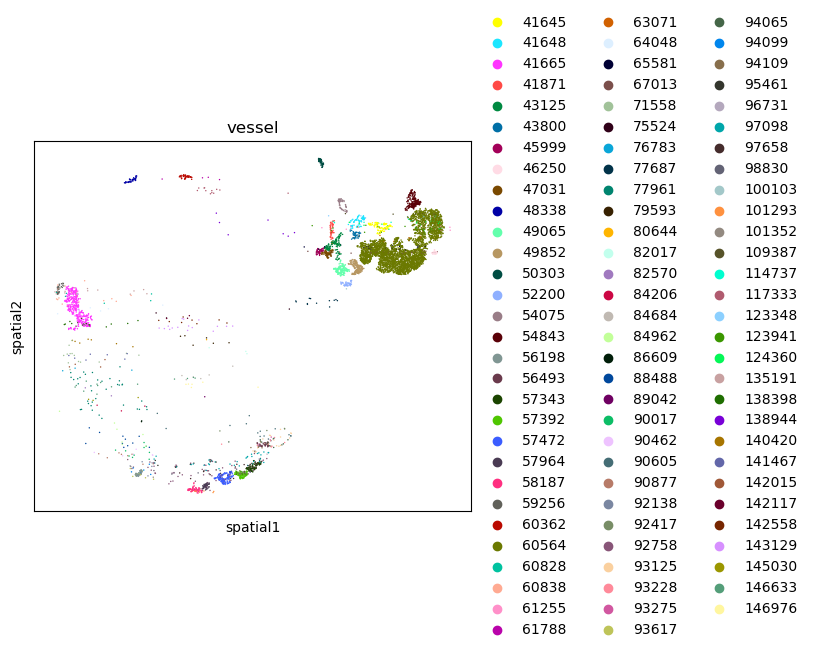

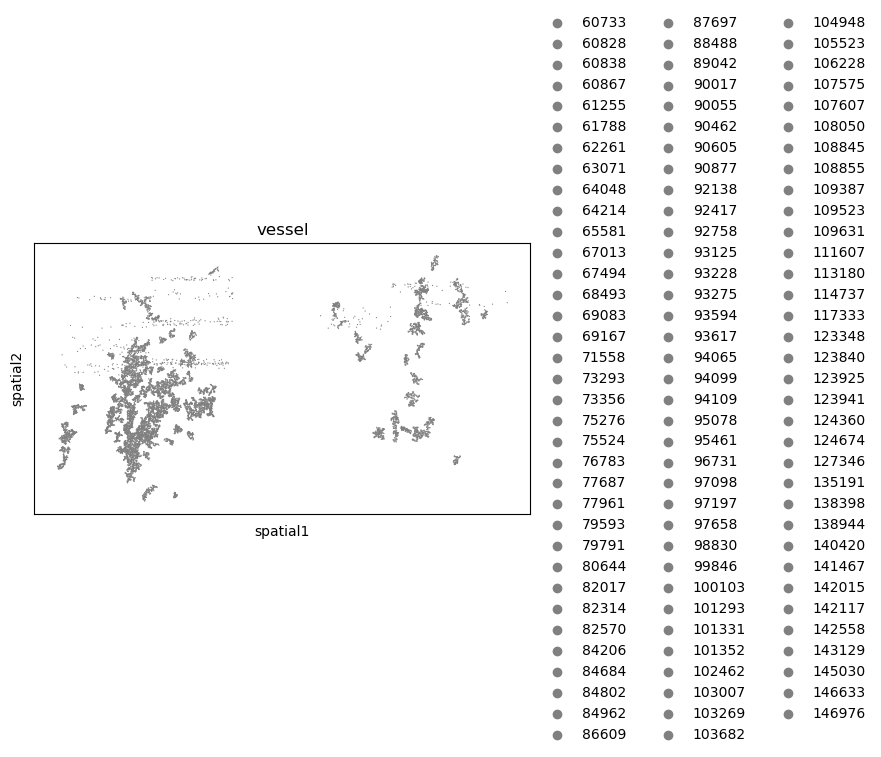

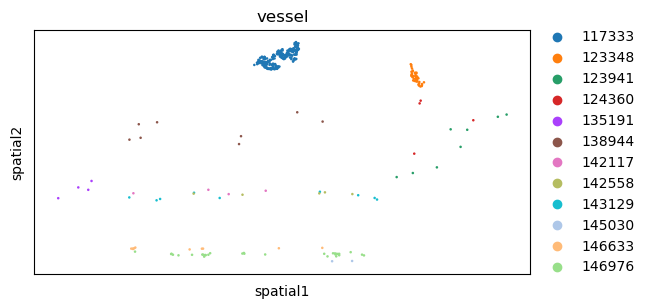

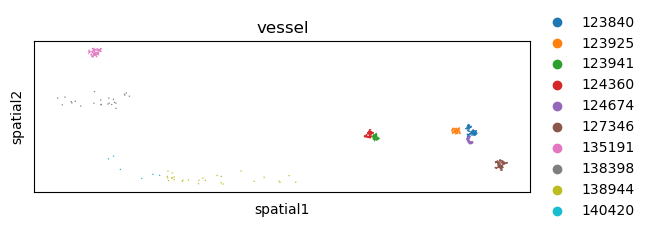

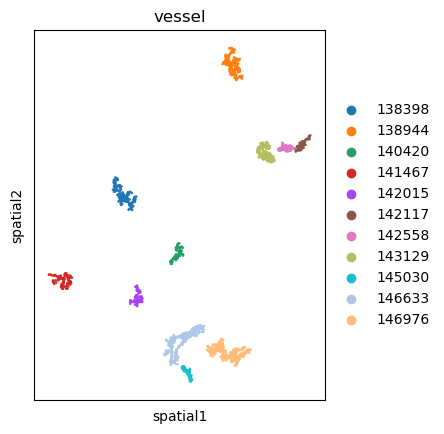

In [24]:
for s in ad_vessel.obs['sample'].unique():
    ad_vessel_sub=ad_vessel[ad_vessel.obs['sample']==s]
    ad_vessel_sub=ad_vessel_sub[ad_vessel_sub.obs['vessel_size']>50]
    sc.pl.spatial(ad_vessel_sub,spot_size=100,color='vessel',vmax=40,cmap='tab20c')

# We redefine vessels as polygons
We can just define polygons of vessels that have more than 2 points. Let's try doing that

In [ ]:
anndata_list_2 = []
for s in ad_vessel.obs['sample'].unique():
    print(s)
    adata_sub=adata[adata.obs['sample']==s]
    ad_vessel_sub=ad_vessel[ad_vessel.obs['sample']==s]
    cell_to_vessel=dict(zip(ad_vessel_sub.obs.index,ad_vessel_sub.obs['vessel']))
    adata_sub.obs['closest_vessel']='nan'
    adata_sub.obs['distance_to_vessel']='nan'
    print('caclulating distance to vessel...')
    for rd in tqdm(adata_sub.obs.index):
        meas=((ad_vessel_sub.obs.X-adata_sub.obs.loc[rd,'X'])**2)+((ad_vessel_sub.obs.Y-adata_sub.obs.loc[rd,'Y'])**2)
        adata_sub.obs.loc[rd,'closest_vessel_cell']=meas.idxmin()
        adata_sub.obs.loc[rd,'distance_to_vessel']=np.sqrt(np.min(meas))
    adata_sub.obs['closest_vessel']=list(adata_sub.obs['closest_vessel_cell'].map(cell_to_vessel))
    print('caclulating')
    counts_vessel=ad_vessel_sub.obs.groupby('vessel').count()
    adata_sub.obs['in_vessel']=False
    adata_sub.obs['which_vessel']=0
    counts_vessel_filt=counts_vessel.index[counts_vessel.iloc[:,0]>2][:-1].astype(str)
    for vs in tqdm(counts_vessel_filt):
        ad_vs=ad_vessel_sub.obs[ad_vessel_sub.obs['vessel']==vs]
        points =np.array([ad_vs['X'],ad_vs['Y']]).transpose()   # 30 random points in 2-D
        hull = ConvexHull(points)
        pl=points[hull.vertices]
        polygon = Polygon(pl)
        adata_sub_sub=adata_sub[adata_sub.obs['closest_vessel']==vs][:]
        #plt.figure()
        #plt.scatter(adata_sub_sub.obs.loc[:,'X'],adata_sub_sub.obs.loc[:,'Y'],s=1,vmax=40)
        #plt.scatter(ad_vs.loc[:,'X'],ad_vs.loc[:,'Y'])
        for p in adata_sub_sub.obs.index:
            point = Point(adata_sub_sub.obs.loc[p,'X'],adata_sub_sub.obs.loc[p,'Y'])
            if polygon.contains(point):
                adata_sub.obs.loc[p,'in_vessel']=True
                adata_sub.obs.loc[p,'which_vessel']=vs           
    anndata_list_2.append(adata_sub)
                

3013_4
caclulating distance to vessel...


 46%|██████████████████████████████████▋                                        | 163389/353460 [37:53<49:34, 63.90it/s]

In [ ]:
adata = sc.concat(anndata_list_2, pairwise=True)
adata.obs['distance_to_vessel']=adata.obs['distance_to_vessel'].astype(str)
adata.obs['which_vessel']=adata.obs['which_vessel'].astype(str)

We save two object, one with cells assigned to vessels ('all_vessels.h5ad')  and the other one with all cells, but containing info related with vessels ('all_samples_vessel_analysis.h5ad')

In [ ]:
general_path='/media/sergio/GBX/GBmap samples/'
global_path=general_path+'ISS_samples/'
ad_vessel.write(general_path+'/ISS_global_analysis/all_vessels.h5ad') # should be with colors

In [ ]:
general_path='/media/sergio/GBX/GBmap samples/'
global_path=general_path+'ISS_samples/'
adata.write(general_path+'/ISS_global_analysis/all_samples_vessel_analysis.h5ad') # should be with colors

# If needed, we re-read the adata objects
For instance, if we want to continue from here

In [7]:
general_path='/media/sergio/GBX/GBmap samples/'
global_path=general_path+'ISS_samples/'
ad_vessel=sc.read(general_path+'/ISS_global_analysis/all_vessels.h5ad') # should be with colors

In [6]:
general_path='/media/sergio/GBX/GBmap samples/'
global_path=general_path+'ISS_samples/'
adata=sc.read(general_path+'/ISS_global_analysis/all_samples_vessel_analysis.h5ad') # should be with colors

# We try to relate the vessel size with the structure-based division of samples (obtained in STEP2)

In [8]:
struct_dict={'3013_4':'structured', '3065':'structured', '3123':'unstructured', '3137':'unstructured', '3172':'unstructured', 'NH17161':'unstructured',
                  'NH17442':'structured', 'NH19565B':'unstructured', 'NH171245':'structured', 'NH171431':'unstructured', 'NH172680':'structured',
                  'NH181406':'unstructured', 'UU3164':'unstructured'}

In [20]:
ad_vessel_large=ad_vessel[ad_vessel.obs['vessel_size']>10]
large_vessel=ad_vessel_large.obs.groupby('sample').count()
g1=lv.loc[lv.struct=='structured','large_vessels']
g2=lv.loc[lv.struct=='unstructured','large_vessels']

In [22]:
scpst.ttest_ind(g1,g2).pvalue

0.07049965562179743

We compute relation between structured/unstructured samples and presence of large vessels

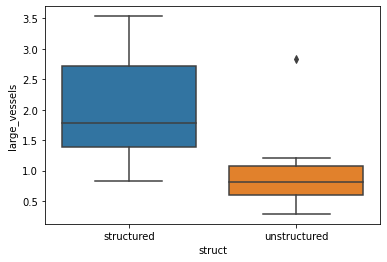

In [24]:
lv=pd.DataFrame(large_vessel.iloc[:,0]/adata.obs.groupby('sample').count().iloc[:,0])*100
lv.columns=['large_vessels']
lv['struct']=lv.index.map(struct_dict)
lv=lv.sort_values(by='struct')
sns.boxplot(x=lv.struct,y=lv.large_vessels)
plt.savefig(general_path+'/ISS_global_analysis/boxplot_%_of_large_vessels_in_struc_vs_unstruc_samples.pdf')

We compute relation between structured/unstructured samples and mean vessel size

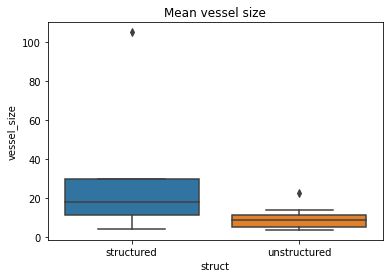

In [27]:
resu=ad_vessel.obs.groupby('sample').mean()
resu['struct']=resu.index.map(struct_dict)
plt.figure()
sns.boxplot(x=resu.struct,y=resu.vessel_size)
plt.title('Mean vessel size')
plt.savefig(general_path+'/ISS_global_analysis/mean_vessel_size_in_struc_vs_unstruc_samples.pdf')

We compute relation between structured/unstructured samples and percentage of cells assigned  to vessels by sample

In [29]:
resu=ad_vessel.obs.groupby('sample').count()
resu['struct']=resu.index.map(struct_dict)
resu['perc_vessels']=resu['vessel']/(adata.obs.groupby('sample').count().iloc[:,0])*100
g1=resu.loc[resu.struct=='structured','perc_vessels']
g2=resu.loc[resu.struct=='unstructured','perc_vessels']

In [33]:
scpst.ttest_ind(g1,g2).pvalue

0.027945553621009485

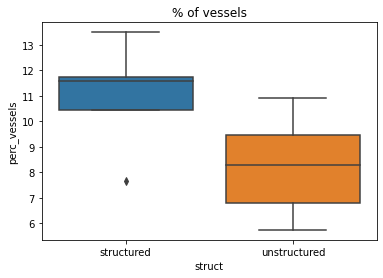

In [30]:
plt.figure()
sns.boxplot(x=resu.struct,y=resu.perc_vessels)
plt.title('% of vessels')
plt.savefig(general_path+'/ISS_global_analysis/prop_vascular_cells_in_struc_vs_unstruc_samples.pdf')

# We check if the proportion of cell types change depending on the vessel size

We extract the cells within vessels and check wether they are enriched or depleted in big ones

In [11]:
dict_vesselsize_round=dict(zip(ad_vessel.obs['vessel'],ad_vessel.obs['vessel_size_round']))
dict_vesselsize=dict(zip(ad_vessel.obs['vessel'],ad_vessel.obs['vessel_size']))
adata_in_vessels=adata[adata.obs['in_vessel']==True]
adata_in_vessels.obs['vessel_size_round']=adata_in_vessels.obs['which_vessel'].map(dict_vesselsize_round)
adata_in_vessels.obs['vessel_size']=adata_in_vessels.obs['which_vessel'].map(dict_vesselsize)
ct_by_vessel_size=pd.crosstab(adata_in_vessels.obs['level3'],adata_in_vessels.obs['vessel_size_round'])

Text(0.5, 1.0, 'number of cells within the vessel compared to vessel size (n_cells)')

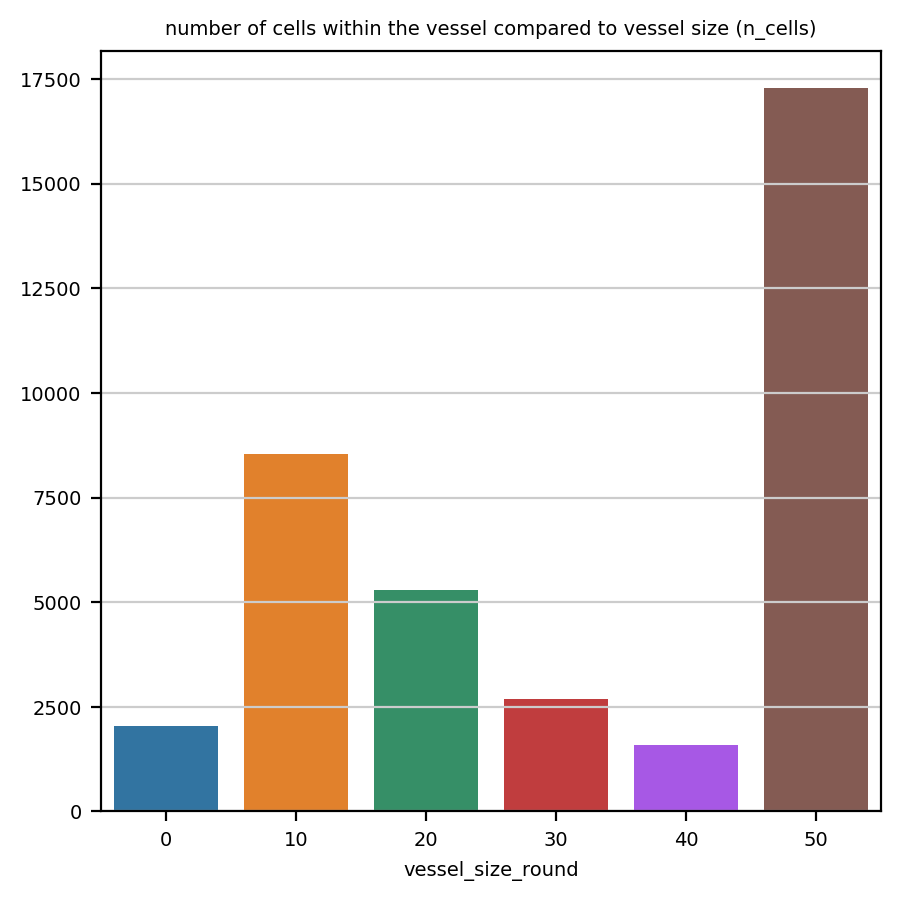

In [13]:
plt.figure(figsize=(5,5))
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=100, frameon=False, vector_friendly=True, fontsize=7, figsize=(6,6), color_map=None, format='pdf', facecolor=None, transparent=False, ipython_format='png2x')
sns.barplot(x=ct_by_vessel_size.columns,y=ct_by_vessel_size.sum(axis=0))
plt.title('number of cells within the vessel compared to vessel size (n_cells)')

<AxesSubplot:xlabel='vessel_size_round'>

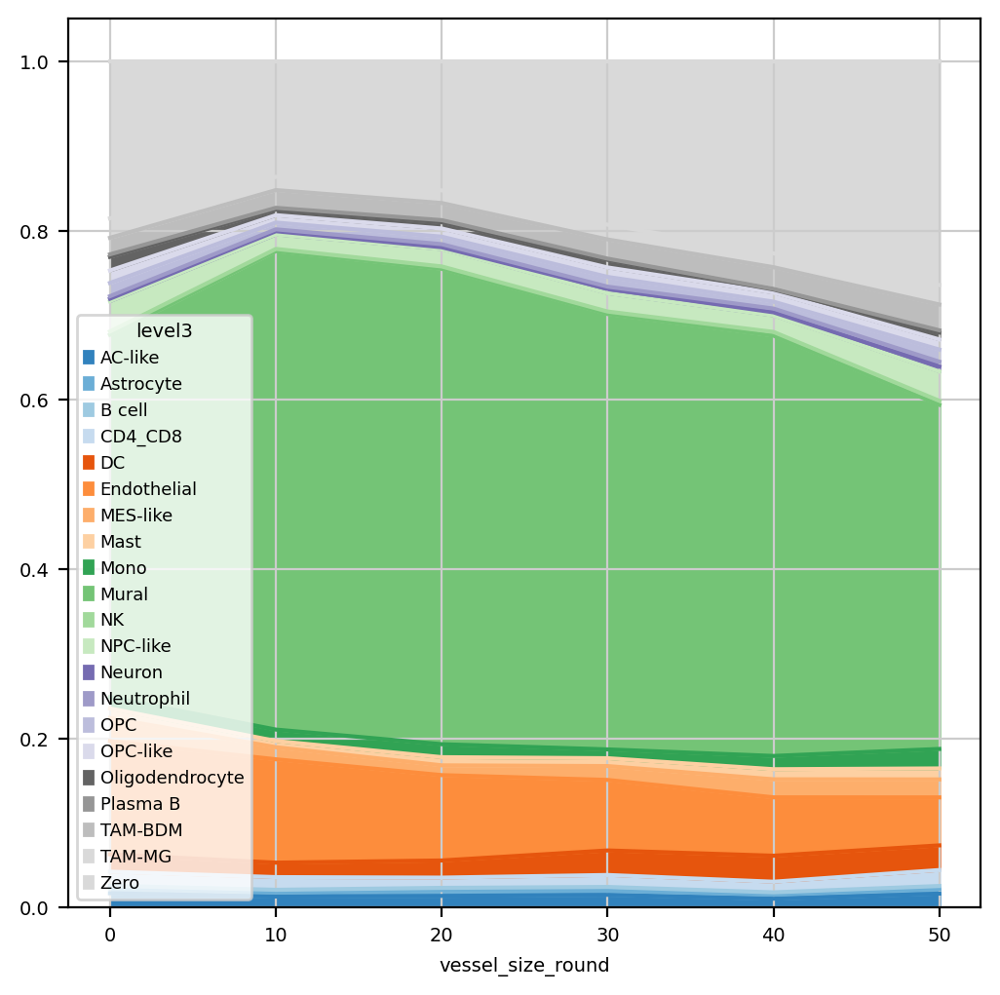

In [14]:
cvn=ct_by_vessel_size.div(ct_by_vessel_size.sum(axis=0),axis=1)
cvn.transpose().plot(kind='area',cmap='tab20c')

Same plot without mural

In [16]:
ct_by_vessel_size=pd.crosstab(adata_in_vessels.obs['level3'],adata_in_vessels.obs['vessel_size_round'])
ct_by_vessel_size=ct_by_vessel_size.loc[~ct_by_vessel_size.index.isin(['Mural','Endothelial','Zero']),:]
cvn=ct_by_vessel_size.div(ct_by_vessel_size.sum(axis=0),axis=1)
cvn.transpose().plot(kind='area',cmap='tab20')

We can also represent it as a heatmap

In [19]:
cvn2=cvn.div(cvn.sum(axis=1),axis=0)

Text(0.5, 1.0, 'Cell types inside vessels depending on the vessel size')

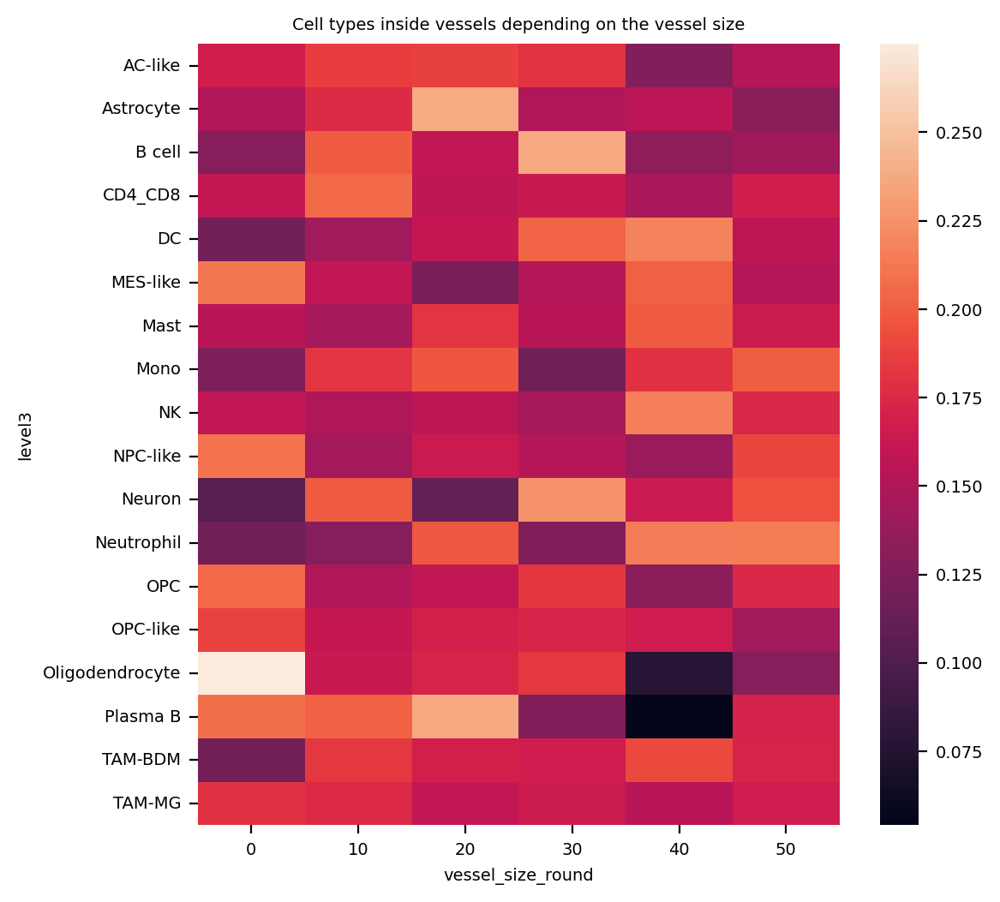

In [21]:
sns.heatmap(cvn2)
plt.title('Cell types inside vessels depending on the vessel size')

# Now we  focus on the cells not in vessels

In [99]:
adata_no_vessels=adata[adata.obs['in_vessel']==False]

In [100]:
dict_vesselsize_round=dict(zip(ad_vessel.obs['vessel'],ad_vessel.obs['vessel_size_round']))
dict_vesselsize=dict(zip(ad_vessel.obs['vessel'],ad_vessel.obs['vessel_size']))
adata_no_vessels.obs['vessel_size_round']=list(adata_no_vessels.obs['closest_vessel'].map(dict_vesselsize_round))
adata_no_vessels.obs['vessel_size']=list(adata_no_vessels.obs['closest_vessel'].map(dict_vesselsize))
cluster_to_closest_vessel=pd.crosstab(adata_no_vessels.obs['level3'],adata_no_vessels.obs['vessel_size_round'])

Text(0.5, 1.0, 'Size of the closest vessel')

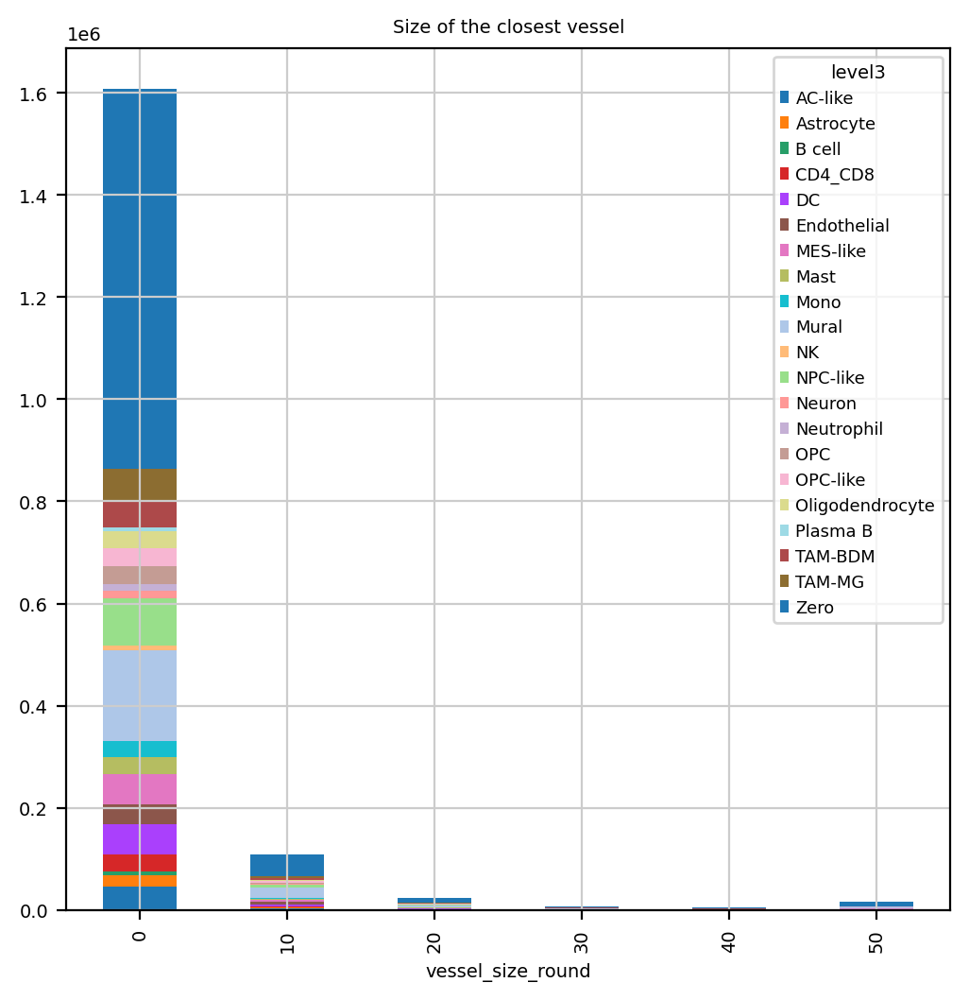

In [103]:
cluster_to_closest_vessel.transpose().plot(kind='bar',stacked=True)
plt.title('Size of the closest vessel')

In [192]:
cluster_to_closest_vessel=cluster_to_closest_vessel.loc[~cluster_to_closest_vessel.index.isin(['Mural','Endothelial','Zero']),:]

In [200]:
ctv_norm=cluster_to_closest_vessel.div(cluster_to_closest_vessel.sum(axis=0),axis=1).transpose()

Text(0.5, 1.0, 'Size of the closest vessel, normalized')

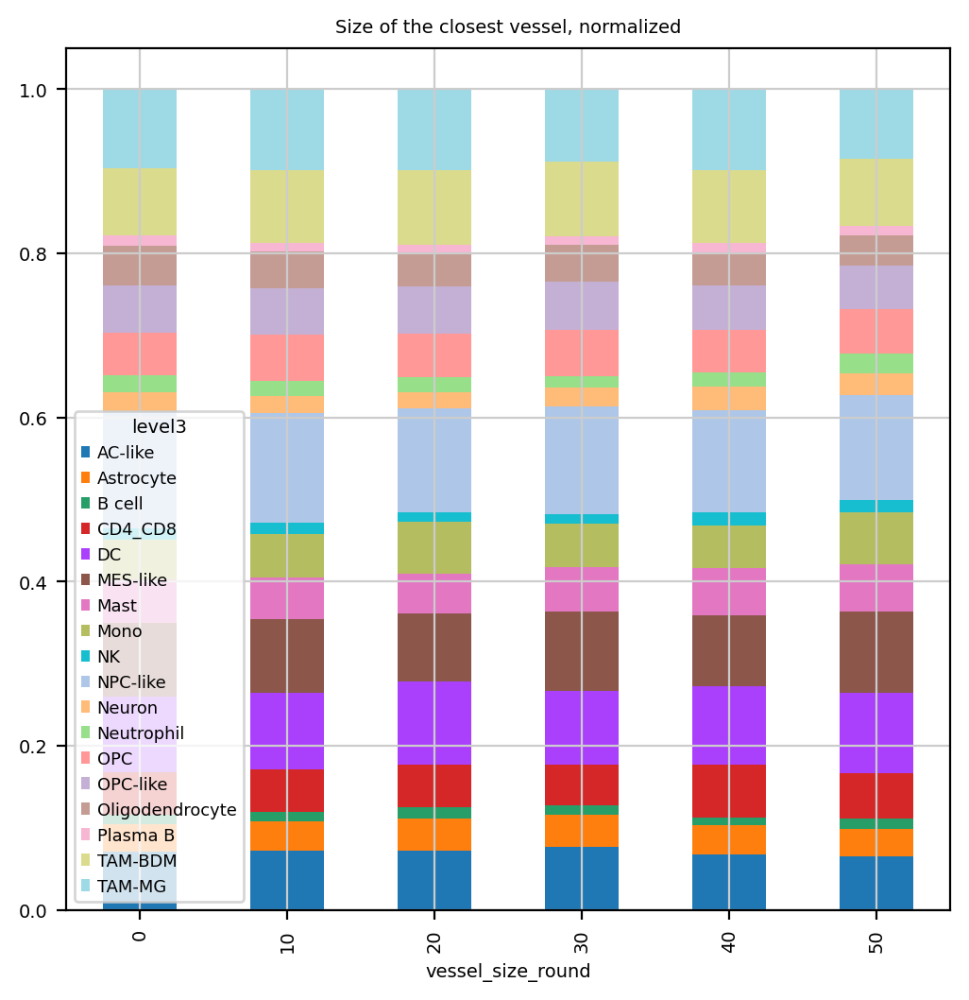

In [201]:
ctv_norm.plot(kind='bar',stacked='True')
plt.title('Size of the closest vessel, normalized')

# Now we look at the effect of the distance to vessel

We exclude all endothelial and mural cells from analysis

In [106]:
adata_no_vessels=adata_no_vessels[~adata_no_vessels.obs['level3'].isin(['Zero','Endothelial','Mural'])]

In [107]:
adata_no_vessels.obs['distance_to_vessel']=adata_no_vessels.obs['distance_to_vessel'].astype(float)
adata_no_vessels.obs['distance_to_vessel_rounded']=(adata_no_vessels.obs['distance_to_vessel']*4).round(-2)/4
adata_no_vessels.obs.loc[adata_no_vessels.obs['distance_to_vessel_rounded']>150,'distance_to_vessel_rounded']=150

<AxesSubplot:xlabel='level4'>

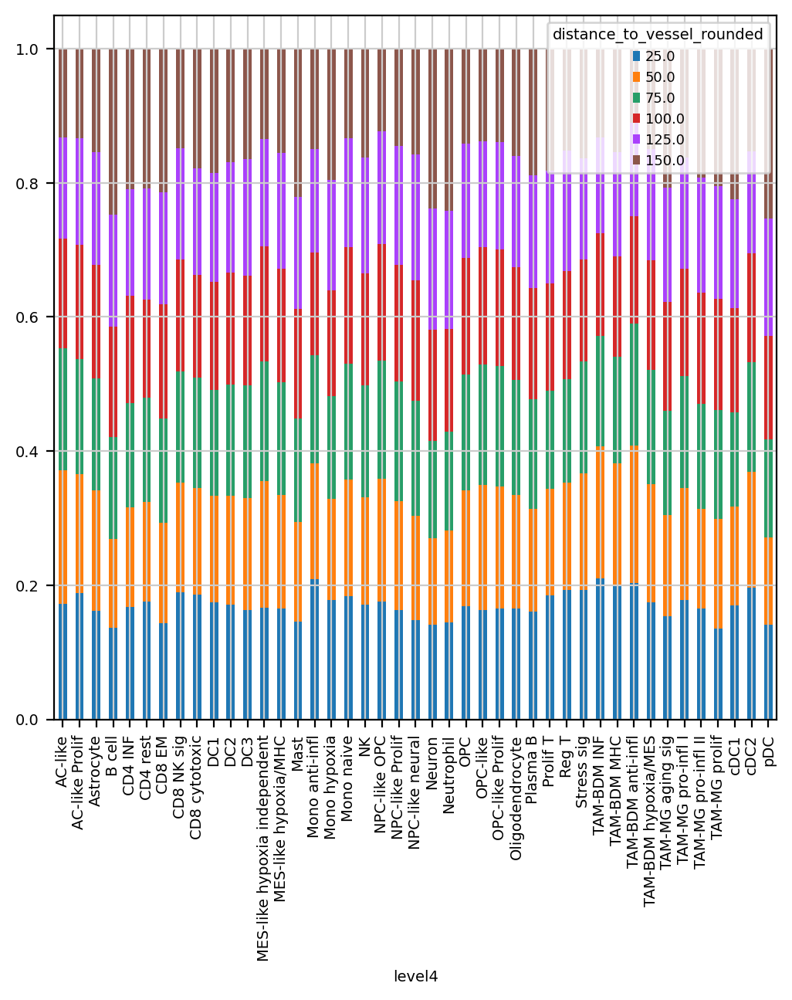

In [116]:
cluster_distance_vessel=pd.crosstab(adata_no_vessels.obs['level4'],adata_no_vessels.obs['distance_to_vessel_rounded'])
cluster_distance_vessel=cluster_distance_vessel.iloc[:,1:]
cdv_norm=cluster_distance_vessel.div(cluster_distance_vessel.sum(axis=0),axis=1)
cdv_norm=cdv_norm.div(cdv_norm.sum(axis=1),axis=0)
cdv_norm.plot(kind='bar',stacked=True)

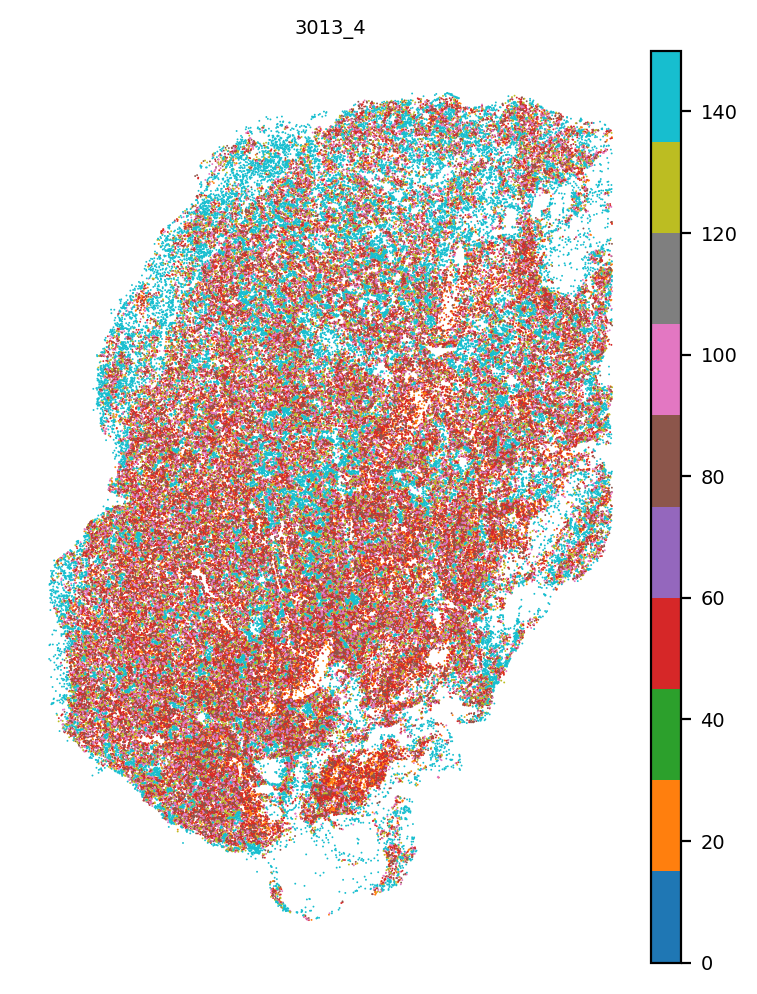

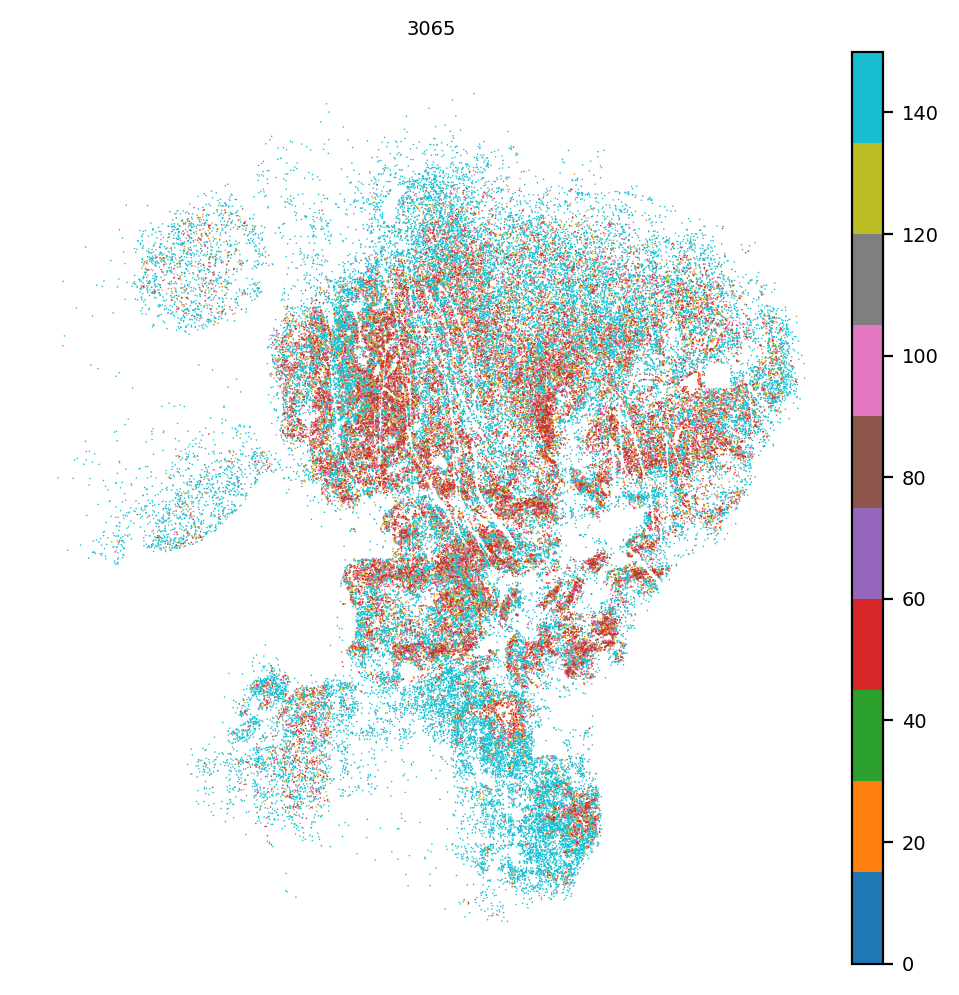

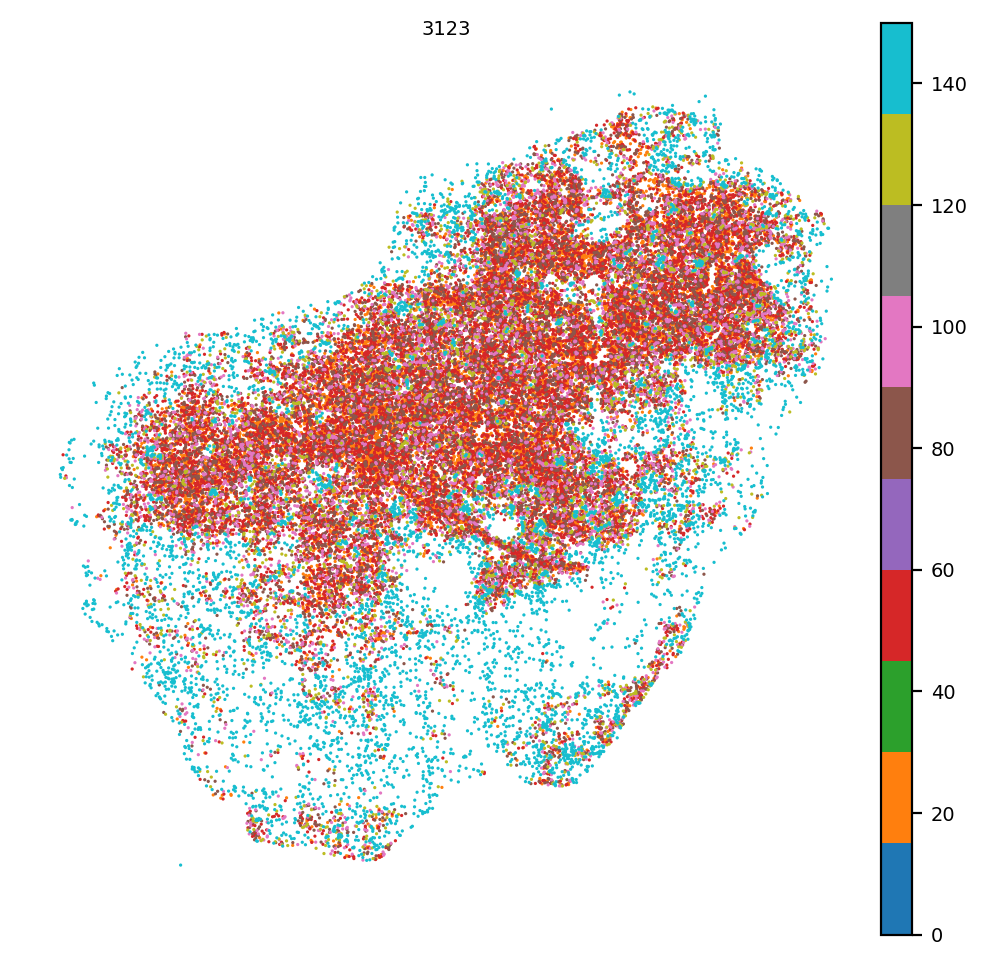

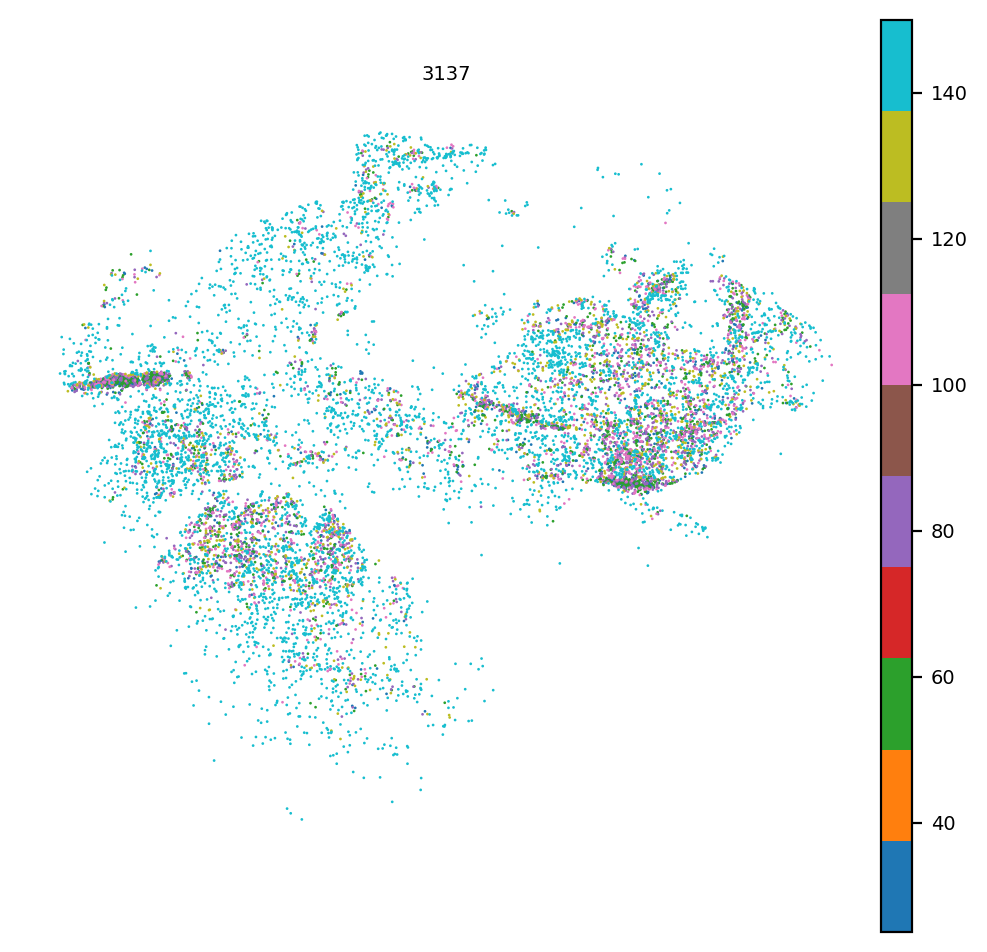

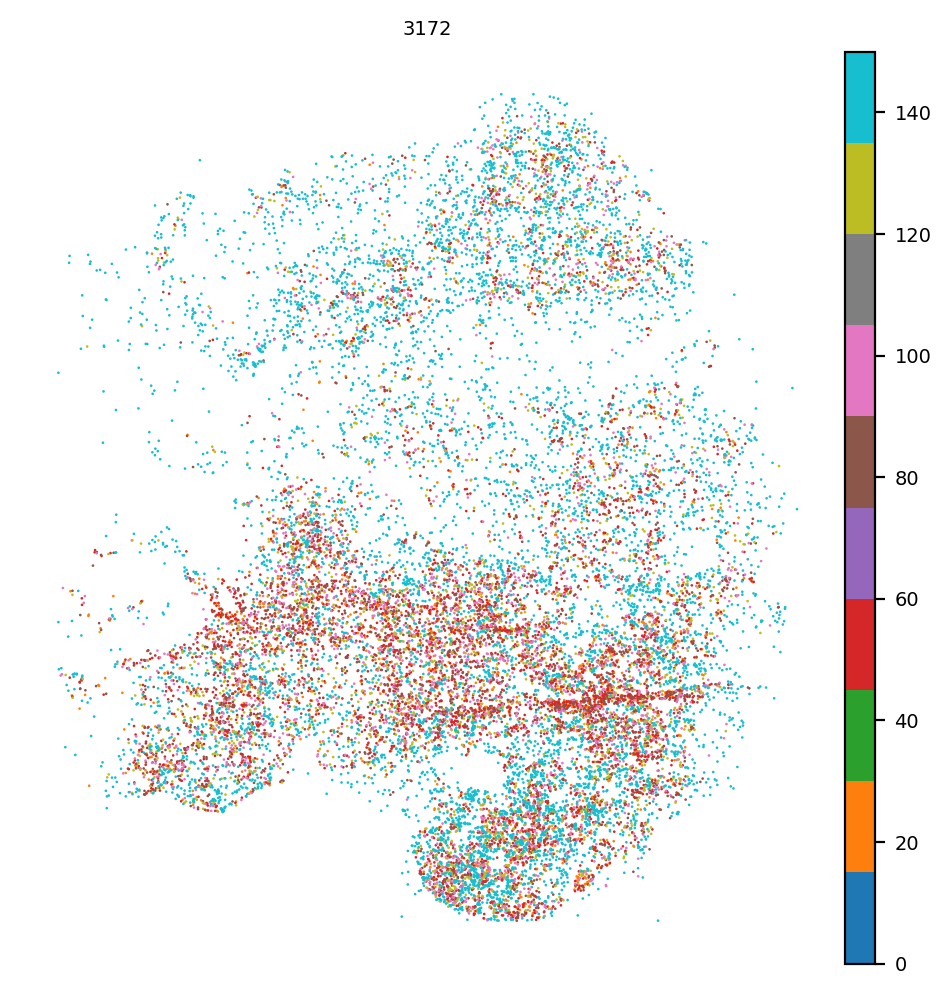

...

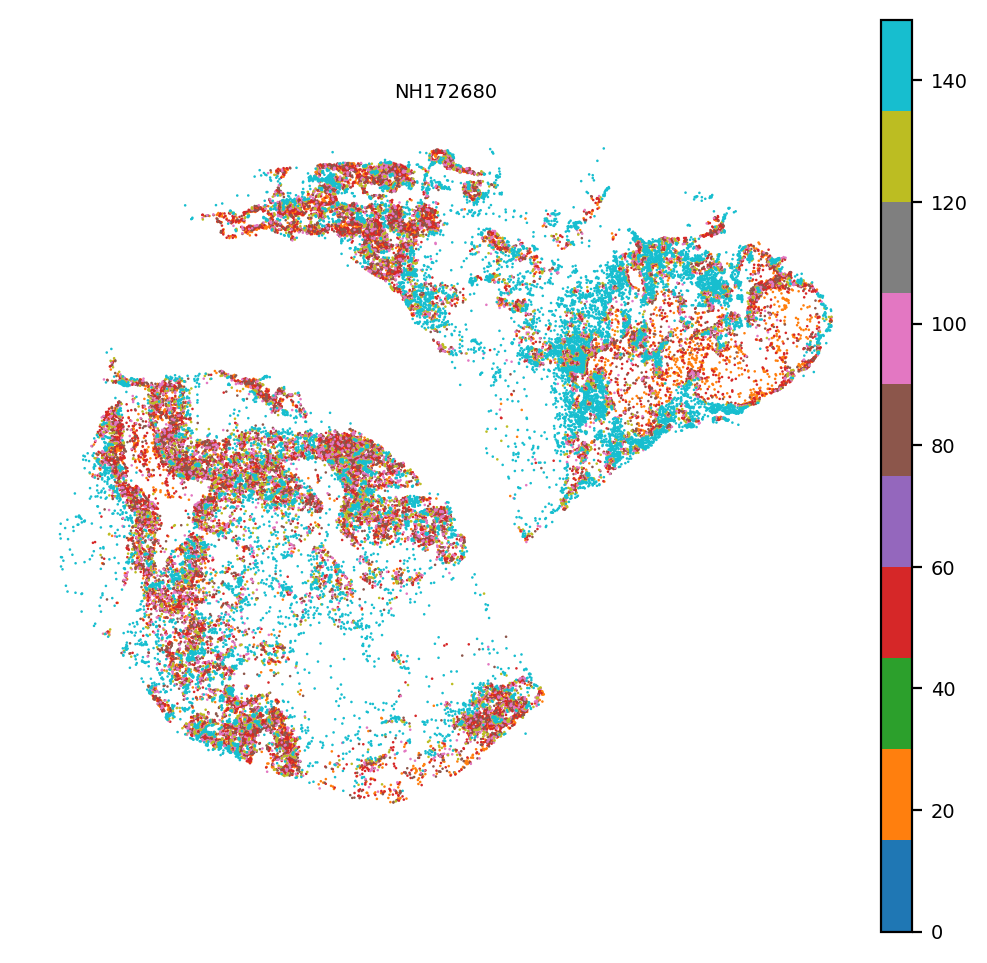

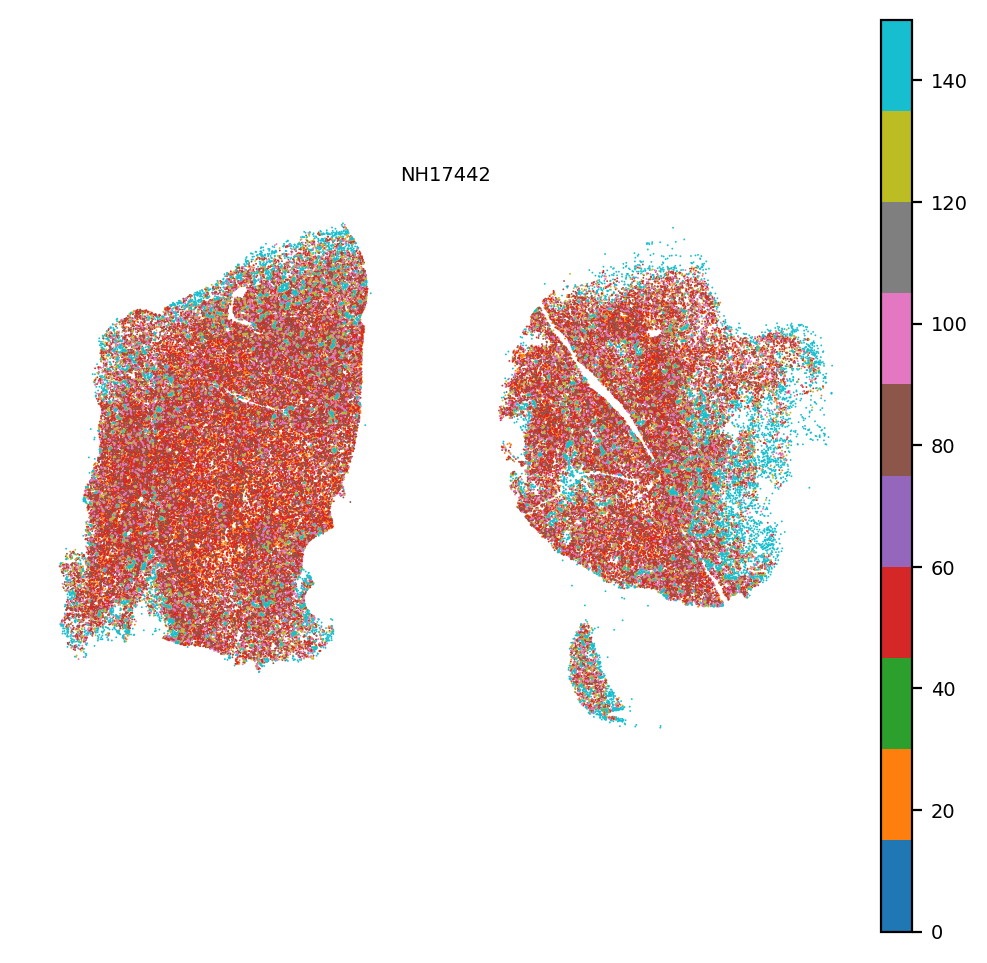

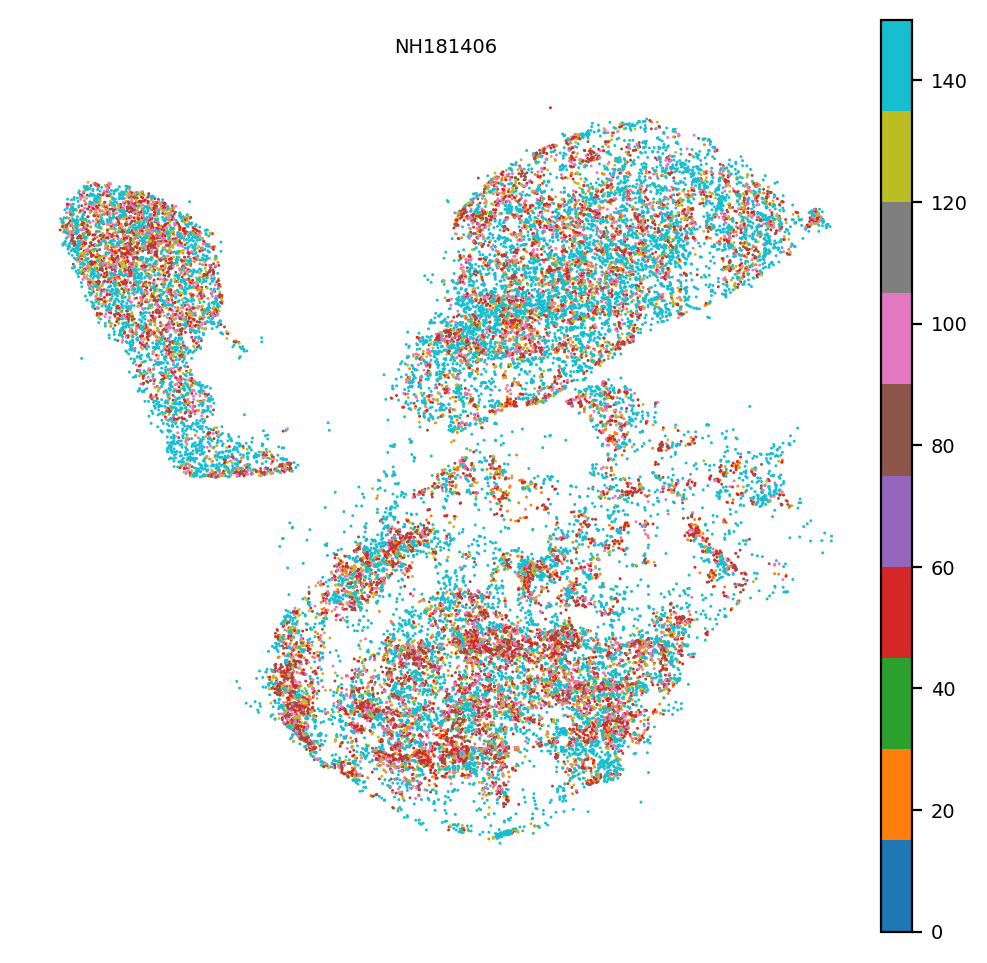

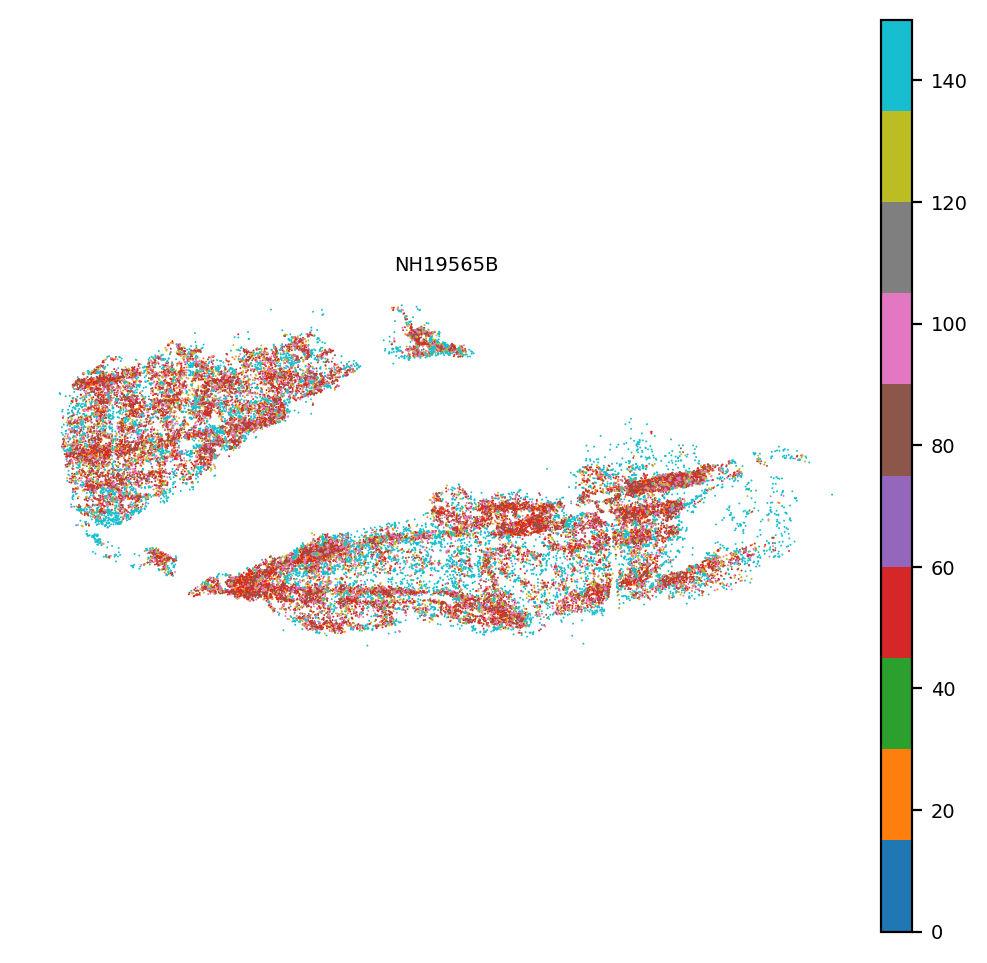

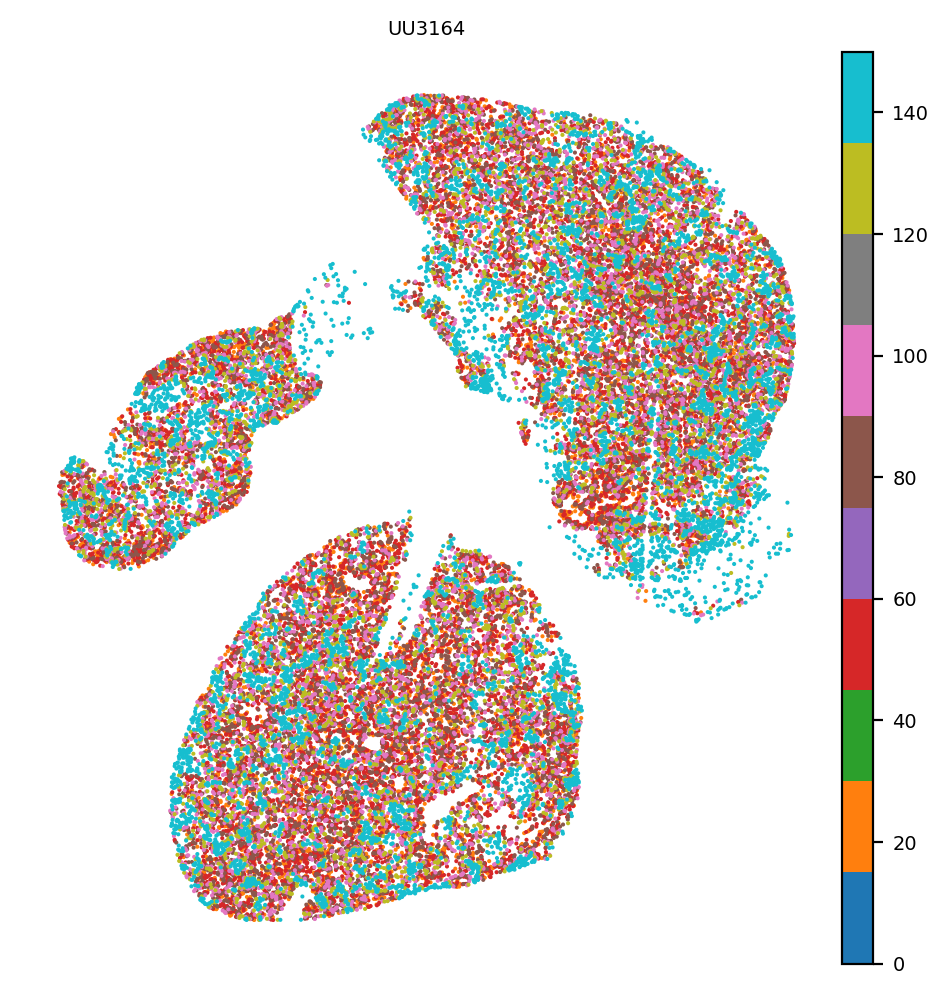

In [182]:
for s in adata_no_vessels.obs['sample'].unique():
    ad_no_vessel_sub=adata_no_vessels[adata_no_vessels.obs['sample']==s]
    ad_vessel_sub=ad_vessel[ad_vessel.obs['sample']==s]
    sc.pl.spatial(ad_no_vessel_sub,spot_size=100,color='distance_to_vessel_rounded',vmax=150,cmap='tab10',show=False,title=s)
    #sc.pl.spatial(ad_vessel_sub,spot_size=100,na_color='green',vmax=300)

In [ ]:
cdv_norm=cdv_norm.loc[['B cell', 'Mono','Neutrophil','Plasma B','CD4_CD8', 'Neuron','Mast',
                  'AC-like', 'Astrocyte',  'DC',
                  'MES-like', 'NK', 'NPC-like',
                   'OPC', 'OPC-like', 'Oligodendrocyte',
                   'TAM-BDM', 'TAM-MG'],:]

Text(0.5, 1.0, 'Frequency of cell type vs distance to closest vessel')

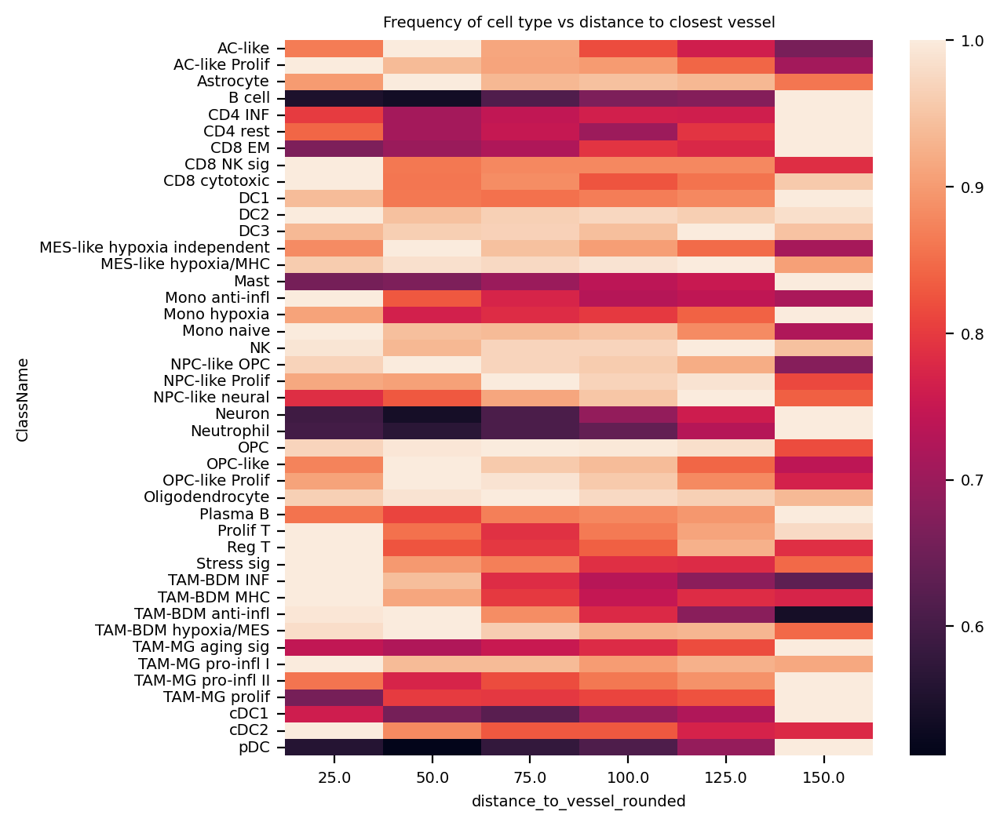

In [202]:
sns.heatmap(cdv_norm,vmax=1)
plt.title('Frequency of cell type vs distance to closest vessel')

# We repeat the same analysis, but now using level4 annotations

<AxesSubplot:xlabel='ClassName'>

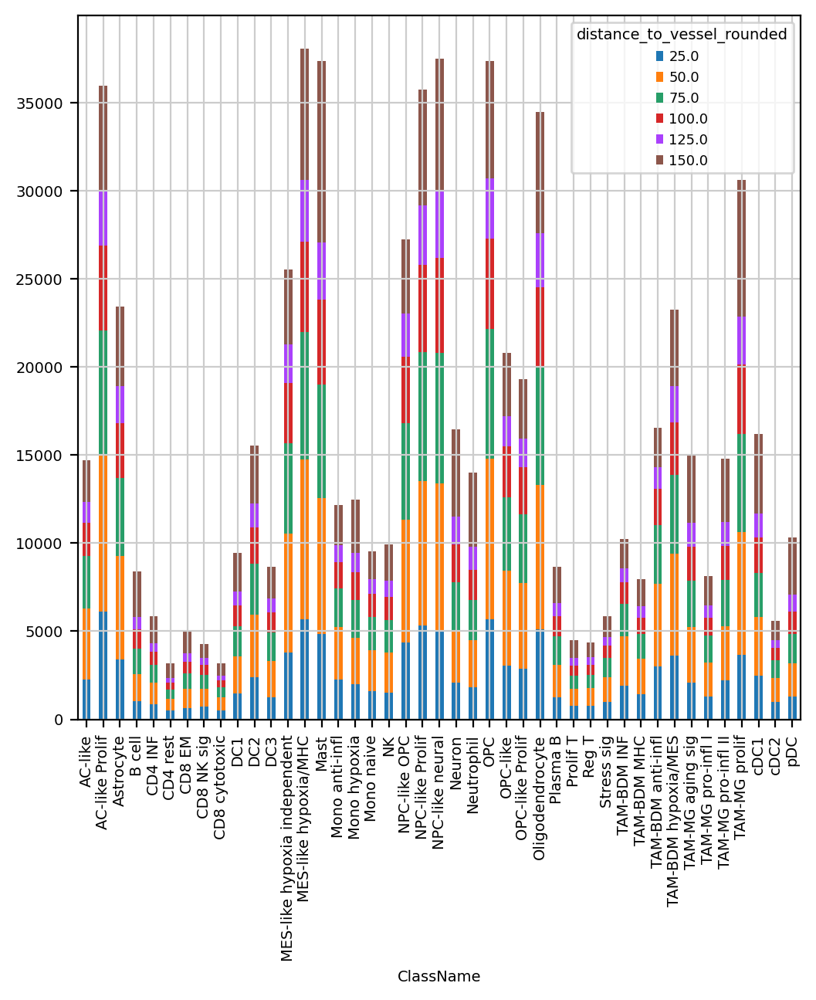

In [120]:
cluster_distance_vessel=pd.crosstab(adata_no_vessels.obs['ClassName'],adata_no_vessels.obs['distance_to_vessel_rounded'])
cluster_distance_vessel=cluster_distance_vessel.iloc[:,1:]
cdv_norm=cluster_distance_vessel.div(cluster_distance_vessel.sum(axis=0),axis=1)
cdv_norm=cdv_norm.div(cdv_norm.max(axis=1),axis=0)
cluster_distance_vessel.plot(kind='bar',stacked=True)

Text(0.5, 1.0, 'Frequency of cell type vs distance to closest vessel')

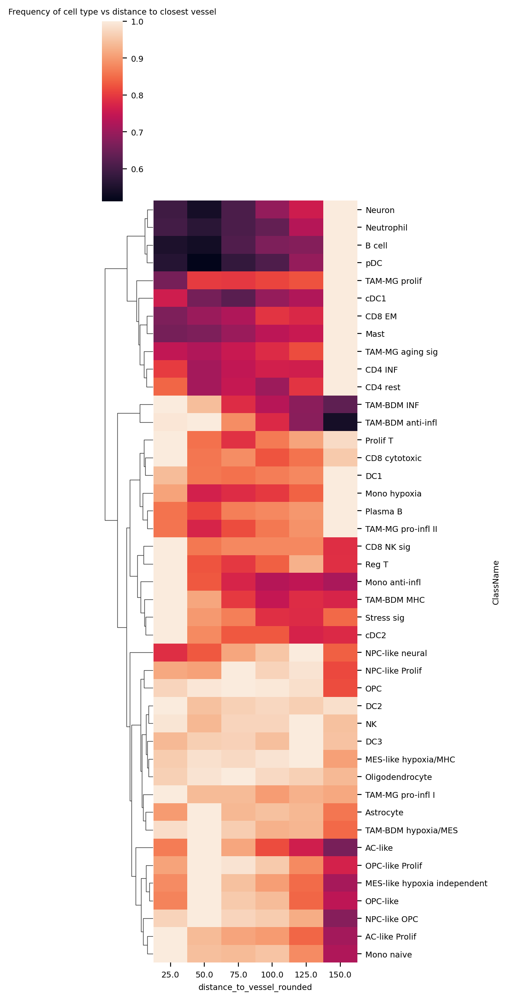

In [121]:
sns.clustermap(cdv_norm,vmax=1,figsize=(5,12),col_cluster=False)
plt.title('Frequency of cell type vs distance to closest vessel')

In [122]:
allnames=[]
allscores=[]
allgroups=[]
allcols=[]
level='level3'
for ct in tqdm(adata_no_vessels.obs[level].unique()):
    try:
        adsub=adata_no_vessels[adata_no_vessels.obs[level]==ct]
        adsub.obs['distance_to_vessel_rounded']=adsub.obs['distance_to_vessel_rounded'].astype('category')
        sc.tl.rank_genes_groups(adsub,groupby='distance_to_vessel_rounded')
        adsub.obs['distance_to_vessel_rounded'].astype('category')
        #sc.pl.rank_genes_groups(adsub)
        scores=pd.DataFrame(adsub.uns['rank_genes_groups']['scores'])
        names=pd.DataFrame(adsub.uns['rank_genes_groups']['names'])
        for col in scores.columns:
            cls=scores.loc[:,col]
            con=abs(cls)>8 # this is the score
            gs=cls[con]
            if len(gs)>0:
                gs2=pd.DataFrame(gs)
                for g in gs2.index:
                    allnames.append(names.loc[g,col])
                    allscores.append(scores.loc[g,col])
                    allgroups.append(ct)
                    allcols.append(col)
    except:
        print('notpossible')

  0%|                                                                                            | 0/18 [00:00<?, ?it/s]

  6%|████▋                                                                               | 1/18 [00:00<00:04,  3.66it/s]

 11%|█████████▎                                                                          | 2/18 [00:01<00:14,  1.10it/s]

 17%|██████████████                                                                      | 3/18 [00:02<00:13,  1.12it/s]

 22%|██████████████████▋                                                                 | 4/18 [00:03<00:11,  1.24it/s]

 28%|███████████████████████▎                                                            | 5/18 [00:04<00:10,  1.19it/s]

 33%|████████████████████████████                                                        | 6/18 [00:04<00:08,  1.42it/s]

 39%|████████████████████████████████▋                                                   | 7/18 [00:04<00:06,  1.60it/s]

 44%|█████████████████████████████████████▎                                              | 8/18 [00:05<00:06,  1.48it/s]

 50%|██████████████████████████████████████████                                          | 9/18 [00:06<00:05,  1.64it/s]

 56%|██████████████████████████████████████████████                                     | 10/18 [00:06<00:04,  1.84it/s]

 61%|██████████████████████████████████████████████████▋                                | 11/18 [00:07<00:04,  1.68it/s]

 67%|███████████████████████████████████████████████████████▎                           | 12/18 [00:07<00:03,  1.88it/s]

 72%|███████████████████████████████████████████████████████████▉                       | 13/18 [00:08<00:02,  2.19it/s]

 78%|████████████████████████████████████████████████████████████████▌                  | 14/18 [00:08<00:01,  2.76it/s]

 83%|█████████████████████████████████████████████████████████████████████▏             | 15/18 [00:08<00:01,  2.60it/s]

notpossible
notpossible


100%|███████████████████████████████████████████████████████████████████████████████████| 18/18 [00:08<00:00,  2.06it/s]

notpossible


# We can also do an  analysis by sample

We aim to categorize samples based on their vessels. We can either do content or vessel size

In [87]:
adata=adata[adata.obs['level4']!='Zero']

In [88]:
vessel_presence=pd.crosstab(adata.obs['sample'],adata.obs['in_vessel'])
vp=vessel_presence.div(vessel_presence.sum(axis=1),axis=0)
vp.columns=['no_vessel','vessel_perc']
vs=pd.DataFrame(ad_vessel.obs.groupby('sample').mean()['vessel_size'])
vp['vessel_size']=vs['vessel_size']

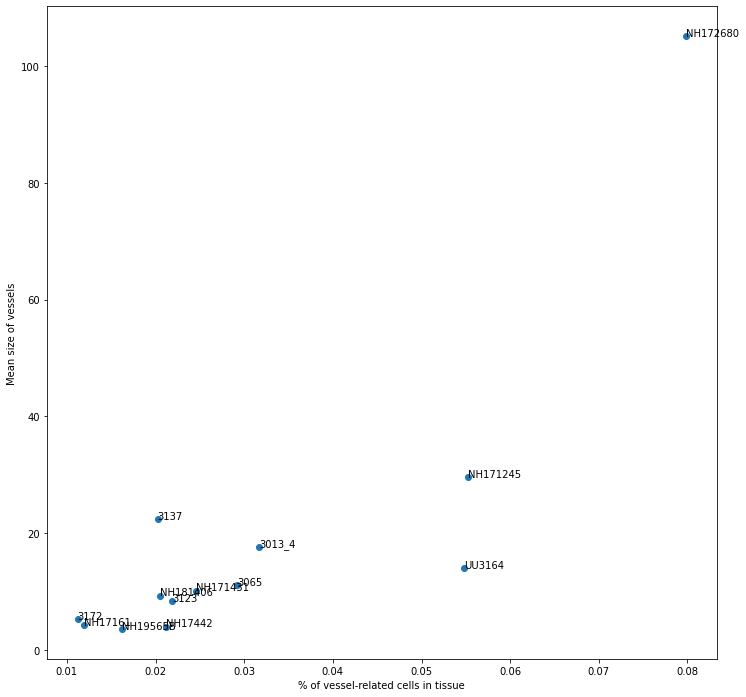

In [89]:
fig, ax = plt.subplots(figsize=(12,12))
ax.scatter(vp['vessel_perc'],vp['vessel_size'])
plt.xlabel('% of vessel-related cells in tissue')
plt.ylabel('Mean size of vessels')
for i, txt in enumerate(vp.index):
    ax.annotate(txt, (vp.loc[txt,'vessel_perc'], vp.loc[txt,'vessel_size']),size=10)